In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
from matplotlib import pyplot as plt
from abnumber import Chain
from bin.utils import heading
from bin.evaluation import plot_oasis_curves, plot_overlap, plot_overlap_boxplot, plot_overlap_venns, \
    plot_overlap_venn, collect_positions, read_oasis_chains
import matplotlib
matplotlib.rcParams['hatch.linewidth'] = 0.8
from scipy import stats

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
TASK_DIR = '../../data/tasks/therapeutic_rediscovery'
GERMLINE = 'manual'

In [3]:
PARENTAL = dict(
    name='Parental',
    color='tab:red',
    ls='-',
    path=os.path.join(TASK_DIR, 'oas_cdr_hits/parental')
)

EXPERIMENTAL = dict(
    name='Experimental',
    color='tab:green',
    ls='-',
    path=os.path.join(TASK_DIR, 'thera/humanized')
)

HUMAB = dict(
    name='Hu-mAb',
    color='#ff9698',
    ls='-',
    path=os.path.join(TASK_DIR, f'humab/humab_{GERMLINE}')
)

VERNIER_GRAFT = dict(
    name='Vernier graft',
    color='tab:orange',
    ls='--',
    path=os.path.join(TASK_DIR, f'cdr_grafts_{GERMLINE}/vernier_grafts')
)

STRAIGHT_GRAFT = dict(
    name='Straight graft',
    color='tab:cyan',
    ls='--',
    path=os.path.join(TASK_DIR, f'cdr_grafts_{GERMLINE}/straight_grafts')
)

SAPIENS = dict(
    name='Sapiens*1',
    color='#a020c0',
    ls='-',
    path=os.path.join(TASK_DIR, f'predicted_{GERMLINE}/sapiens1')
)

METHODS = [
    PARENTAL,
    EXPERIMENTAL,
    SAPIENS,
    HUMAB,
    VERNIER_GRAFT,
    STRAIGHT_GRAFT
]

HUMANIZED_METHODS = [
    EXPERIMENTAL,
    SAPIENS,
    HUMAB,
    STRAIGHT_GRAFT,
    VERNIER_GRAFT,
]

HUMANIZED_METHOD_NAMES = [method['name'] for method in HUMANIZED_METHODS]


SELECTED_METHODS = [
    PARENTAL,
    EXPERIMENTAL,
    SAPIENS,
    HUMAB,
    STRAIGHT_GRAFT,
    VERNIER_GRAFT,
]

SELECTED_METHOD_NAMES = [method['name'] for method in SELECTED_METHODS]


COLORS = {method['name']: method['color'] for method in METHODS}
LINESTYLES = {method['name']: method['ls'] for method in METHODS}

HUMANIZED_COLORS = {method['name']: method['color'] for method in HUMANIZED_METHODS}

SELECTED_COLORS = {method['name']: method['color'] for method in SELECTED_METHODS}

In [4]:
parental_heavy, parental_light, _, _ = read_oasis_chains(PARENTAL['path'] + '_oasis.xlsx')
NAMES = parental_heavy.index.values

In [5]:
experimental_heavy, experimental_light, experimental_heavy_germlines, experimental_light_germlines = read_oasis_chains(
    EXPERIMENTAL['path'] + '_oasis.xlsx', 
    index=NAMES
)

print(parental_heavy[0].align(experimental_heavy[0], experimental_heavy_germlines[0]))
print()
print(parental_light[0].align(experimental_light[0], experimental_light_germlines[0]))

QVQLQQSGAELAKPGASVKLSCKASGYTFTSFWMHWVKQRPGQGLEWIGYINPRSGYTEYNEIFRDKATLTADKSSSTAYMQLSSLTSEDSAVYYCARFLGRGAMDYWGQGTSVTVSS
||||||||.||||||||||+|||||||||+|||||||+|.|||||||||||||||||||||||||||||+|.|.|+|||||+||||.|||+||||||.||||||||||||||+|||||
QVQLQQSGGELAKPGASVKVSCKASGYTFSSFWMHWVRQAPGQGLEWIGYINPRSGYTEYNEIFRDKATMTTDTSTSTAYMELSSLRSEDTAVYYCASFLGRGAMDYWGQGTTVTVSS
||||.|||.|+.|||||||||||||||||+|++||||||||||||||+|.|||..|.|.|.+.|+.+.|||.||||||.||||||||||||||||||......|.|.|||||.|||||
QVQLVQSGAEVKKPGASVKVSCKASGYTFTSYYMHWVRQAPGQGLEWMGIINPSGGSTSYAQKFQGRVTMTRDTSTSTVYMELSSLRSEDTAVYYCAR----DAFDVWGQGTMVTVSS
 °                        °°°°^^^^^           °°°^^^^^^^^^^^^^^^^^ ° ° ° °    °                 °°^^^^^^^^^°          

DIQMTQTTSSLSASLGDRVTISCRASQDISNYLAWYQQKPDGTIKLLIYYTSKIHSGVPSRFSGSGSGTDYSLTISNLEQEDIATYFCQQGNTFPYTFGGGTKLEIK
||||||+.||||||+||||||+||||||||||||||||||....|||||||||||||||||||||||||||+.|||+|+.||||||+||||||||||||.|||+|||
DIQMTQSPSSLSASVGDRVTITCRASQDISNYLAWYQQKPGKAPKLLIYYTSKIHSGVPSRFSGSGSGT

In [6]:
oasis_curves = []
t20_scores = []
positions = []

for method in METHODS:
    oasis_curve = pd.read_excel(method['path'] + '_oasis.xlsx', sheet_name='OASis Curves', index_col=0)
    oasis_curve = oasis_curve.loc[NAMES].reset_index()
    oasis_curve.insert(0, 'Method', method['name'])
    oasis_curves.append(oasis_curve)
    
    t20_score = pd.read_csv(method['path'] + '_T20.tsv', sep='\t').rename(columns={'id': 'Antibody'})
    t20_score = t20_score.groupby('Antibody')['t20'].mean()
    t20_score = t20_score.loc[NAMES].reset_index()
    t20_score.insert(0, 'Method', method['name'])
    t20_scores.append(t20_score)
    
    method_heavy, method_light, germline_heavy, germline_light = read_oasis_chains(
        method['path'] + '_oasis.xlsx', 
        index=NAMES
    )
    
    heavy_positions = collect_positions(
        parental_heavy, 
        method_heavy, 
        germline_heavy,
    )
    heavy_positions.insert(0, 'Method', method['name'])
    heavy_positions.insert(1, 'Chain', 'Heavy')
    positions.append(heavy_positions)
    
    light_positions = collect_positions(
        parental_light, 
        method_light,
        germline_light
    )
    light_positions.insert(0, 'Method', method['name'])
    light_positions.insert(1, 'Chain', 'Light')
    positions.append(light_positions)

del oasis_curve, t20_score, heavy_positions, light_positions
oasis_curves = pd.concat(oasis_curves)
t20_scores = pd.concat(t20_scores)
positions = pd.concat(positions)

In [7]:
oasis_curves.head(2)

,Method,Antibody,0%,1%,2%,3%,4%,5%,6%,7%,...,81%,82%,83%,84%,85%,86%,87%,88%,89%,90%
0,Parental,Abituzumab,1.0,0.693780,0.669856,0.636364,0.617225,0.607656,0.602871,0.602871,...,0.311005,0.311005,0.306220,0.306220,0.306220,0.301435,0.301435,0.301435,0.301435,0.296651
1,Parental,Afutuzumab,1.0,0.618605,0.586047,0.567442,0.567442,0.558140,0.525581,0.516279,...,0.334884,0.334884,0.330233,0.330233,0.330233,0.330233,0.330233,0.330233,0.325581,0.325581


In [8]:
t20_scores.head(2)

,Method,Antibody,t20
0,Parental,Abituzumab,71.91157
1,Parental,Afutuzumab,73.81437


In [9]:
positions.head(2)

,Method,Chain,name,pos,chain,region,in_vernier,parental,predicted,germline,conservation
0,Parental,Heavy,Abituzumab,H1,Heavy,FR1,False,Q,Q,Q,Conserved
1,Parental,Heavy,Abituzumab,H2,Heavy,FR1,True,V,V,V,Conserved


In [10]:
writer = pd.ExcelWriter(os.path.join(TASK_DIR, f'152_pairs_{GERMLINE}_germline_report.xlsx'), engine='xlsxwriter')

oasis_curves.to_excel(writer, sheet_name='OASis', index=False)
t20_scores.to_excel(writer, sheet_name='T20', index=False)
positions.to_excel(writer, sheet_name='Positions', index=False)

writer.close()

# Preservation

In [11]:
def get_mean_conservation(positions, groupby, methods=None):
    conservation = positions.groupby(groupby)['conservation'].value_counts(normalize=True)
    conservation = conservation.unstack().fillna(0)
    conservation.columns.name = None
    return conservation

In [12]:
def conservation_barplot(conservation, rows=1, figsize=(12, 3), methods=None, axes=None):
    with sns.axes_style('whitegrid'):
        num_plots = conservation.index.get_level_values(0).nunique()
        cols = int(np.ceil(num_plots / rows))
        fig = None
        if axes is None:
            fig, axes = plt.subplots(rows, cols, figsize=figsize, sharey=True)
        for i, (title, values) in enumerate(conservation.groupby(level=0, sort=False)):
            values = values.reset_index().set_index('Method')
            assert values.index.is_unique, 'Expected one row for Method'
            if methods is not None:
                values = values.loc[methods]
            color = [COLORS[name] for name in values.index]
            ax = axes.flatten()[i]
            ax.bar(values.index, values['Conserved'], hatch='////', linewidth=0, color=color, alpha=0.8)
            ax.bar(values.index, values['Back-mutated'], linewidth=0, bottom=values['Conserved'], color=color)
            ax.set_xticks(values.index)
            ax.set_xticklabels(values.index, rotation=90)
            ax.set_title(title.replace(' ','\n'))
            #ax.set_xticks([])
            ax.set_ylim(0, 1.04)
            if i % cols == 0:
                ax.set_ylabel('Preservation');
            ax.set_yticks(np.arange(0, 1.01, 0.2))
            ax.set_yticklabels('{:.0%}'.format(v) for v in ax.get_yticks())
        if fig is not None:
            fig.tight_layout(h_pad=2);

In [13]:
pos_conservation = get_mean_conservation(
    positions, 
    groupby=['pos','Chain','Method']
)
pos_conservation.head()

Back-mutated  Conserved  Engineered  Humanized
pos Chain Method                                                        
H1  Heavy Experimental        0.072368   0.743421    0.032895   0.151316
          Hu-mAb              0.072368   0.690789    0.052632   0.184211
          Parental            0.230263   0.769737    0.000000   0.000000
          Sapiens*1           0.006579   0.769737    0.006579   0.217105
          Straight graft      0.000000   0.769737    0.000000   0.230263

In [14]:
region_labels = positions['Chain'] + ' ' + positions['region']
region_conservation = get_mean_conservation(
    positions, 
    groupby=[region_labels,'Method']
).loc[region_labels.unique()]
region_conservation.head()

Back-mutated  Conserved  Engineered  Humanized
          Method                                                        
Heavy FR1 Experimental        0.044737   0.753509    0.017544   0.184211
          Hu-mAb              0.105921   0.768421    0.030482   0.095175
          Parental            0.187281   0.812719    0.000000   0.000000
          Sapiens*1           0.019737   0.769737    0.002193   0.208333
          Straight graft      0.000219   0.768202    0.001535   0.230044

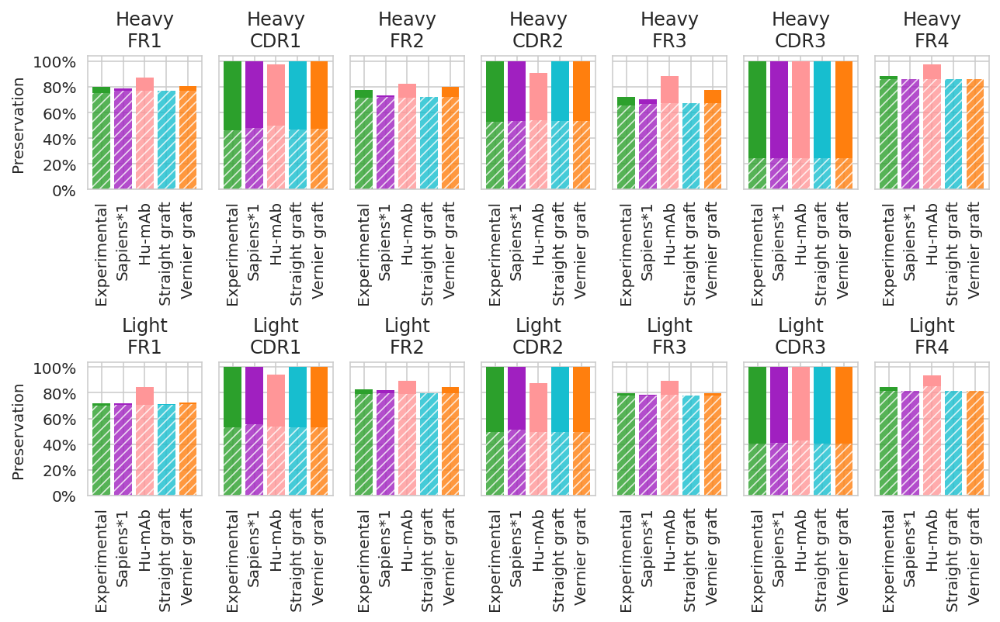

In [15]:
conservation_barplot(
    region_conservation, 
    rows=2, 
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(9, 5.5)
)

In [16]:
vernier_positions = positions[positions['in_vernier']]

In [17]:
pos_labels = vernier_positions['region'] + ' ' + vernier_positions['pos']
vernier_conservation = get_mean_conservation(
    vernier_positions, 
    groupby=[pos_labels,'Chain','Method']
)
vernier_conservation.head()

Back-mutated  Conserved  Engineered  Humanized
       Chain Method                                                        
FR1 H2 Heavy Experimental        0.006579   0.894737    0.000000   0.098684
             Hu-mAb              0.065789   0.875000    0.019737   0.039474
             Parental            0.105263   0.894737    0.000000   0.000000
             Sapiens*1           0.000000   0.894737    0.000000   0.105263
             Straight graft      0.000000   0.894737    0.000000   0.105263

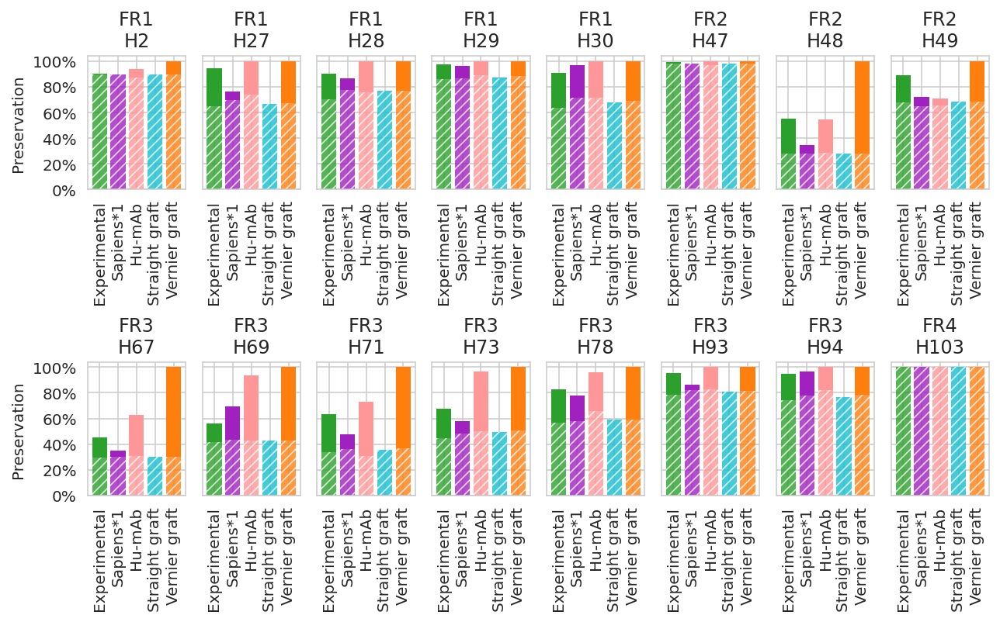

In [18]:
conservation_barplot(
    vernier_conservation[vernier_conservation.index.get_level_values('Chain') == 'Heavy'], 
    rows=2,
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(9, 5.5)
)

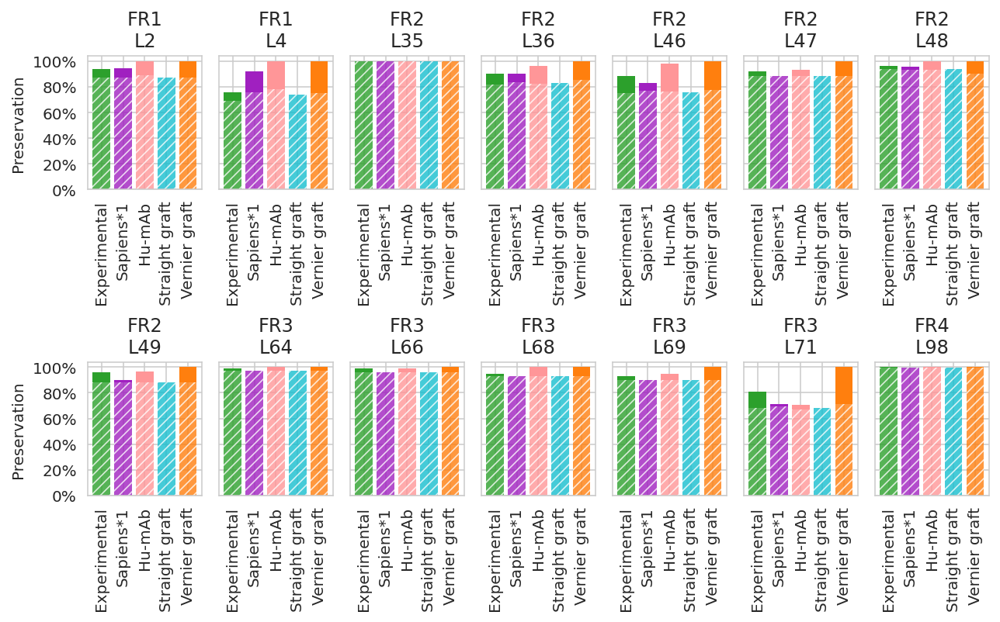

In [19]:
conservation_barplot(
    vernier_conservation[vernier_conservation.index.get_level_values('Chain') == 'Light'], 
    rows=2,
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(9, 5.5)
)

In [20]:
chain_conservation = get_mean_conservation(
    positions, 
    groupby=['Chain','Method']
)
chain_conservation.apply(lambda col: col.apply('{:.0%}'.format))

Back-mutated Conserved Engineered Humanized
Chain Method                                                    
Heavy Experimental            19%       65%         2%       15%
      Hu-mAb                  24%       66%         2%        8%
      Parental                32%       68%         0%        0%
      Sapiens*1               17%       66%         0%       18%
      Straight graft          15%       65%         0%       19%
      Vernier graft           20%       66%         0%       15%
Light Experimental            15%       69%         1%       15%
      Hu-mAb                  20%       70%         1%        9%
      Parental                27%       73%         0%        0%
      Sapiens*1               14%       69%         1%       16%
      Straight graft          14%       69%         0%       17%
      Vernier graft           15%       69%         0%       16%

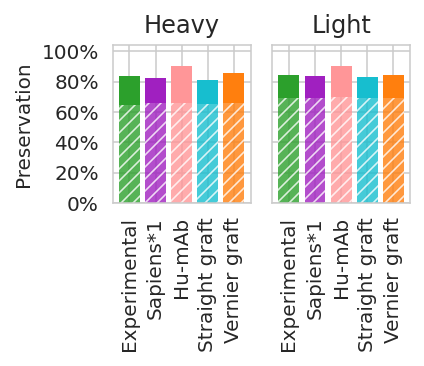

In [21]:
conservation_barplot(
    chain_conservation,
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(3, 2.5)
)

In [22]:
vernier_chain_conservation = get_mean_conservation(
    vernier_positions, 
    groupby=['Chain','Method']
)
vernier_chain_conservation.apply(lambda col: col.apply('{:.0%}'.format))

Back-mutated Conserved Engineered Humanized
Chain Method                                                    
Heavy Experimental            18%       64%         4%       14%
      Hu-mAb                  23%       67%         2%        8%
      Parental                28%       72%         0%        0%
      Sapiens*1               10%       66%         1%       23%
      Straight graft           0%       66%         0%       34%
      Vernier graft           33%       67%         0%        0%
Light Experimental             5%       88%         1%        7%
      Hu-mAb                   8%       88%         0%        4%
      Parental                11%       89%         0%        0%
      Sapiens*1                3%       88%         0%        8%
      Straight graft           0%       88%         0%       12%
      Vernier graft           12%       88%         0%        0%

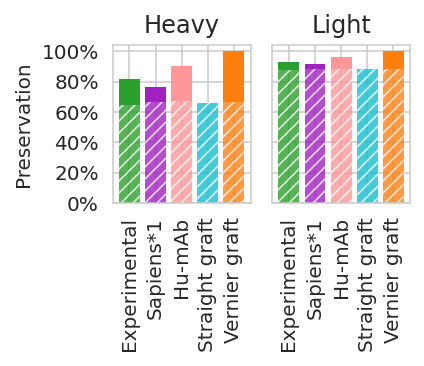

In [23]:
conservation_barplot(
    vernier_chain_conservation, 
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(3, 2.5)
)

# Humanizing mutations overlap

In [24]:
baseline_residues = positions[positions['Method'] == EXPERIMENTAL['name']].set_index(['name','pos'])['predicted'].rename('baseline')
positions_with_baseline = positions.copy()
positions_with_baseline['baseline'] = positions_with_baseline[['name','pos']].apply(tuple, axis=1).apply(baseline_residues.to_dict().get)
positions_with_baseline.head()

,Method,Chain,name,pos,chain,region,in_vernier,parental,predicted,germline,conservation,baseline
0,Parental,Heavy,Abituzumab,H1,Heavy,FR1,False,Q,Q,Q,Conserved,Q
1,Parental,Heavy,Abituzumab,H2,Heavy,FR1,True,V,V,V,Conserved,V
2,Parental,Heavy,Abituzumab,H3,Heavy,FR1,False,Q,Q,Q,Conserved,Q
3,Parental,Heavy,Abituzumab,H4,Heavy,FR1,False,L,L,L,Conserved,L
4,Parental,Heavy,Abituzumab,H5,Heavy,FR1,False,Q,Q,V,Back-mutated,Q


In [25]:
accuracy = positions_with_baseline.groupby('Method').apply(lambda rows: (rows['predicted'] == rows['baseline']).mean())
accuracy.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             88.0%
Parental           84.0%
Sapiens*1          95.6%
Straight graft     96.0%
Vernier graft      96.1%
dtype: object

In [26]:
vernier_accuracy = positions_with_baseline[positions_with_baseline['in_vernier']].groupby('Method').apply(lambda rows: (rows['predicted'] == rows['baseline']).mean())
vernier_accuracy.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             87.5%
Parental           87.0%
Sapiens*1          87.5%
Straight graft     85.7%
Vernier graft      87.0%
dtype: object

In [27]:
mutations = positions_with_baseline.copy()
mutations = mutations[(mutations['parental'] != mutations['predicted']) | (mutations['parental'] != mutations['baseline'])]
mutations.head()

,Method,Chain,name,pos,chain,region,in_vernier,parental,predicted,germline,conservation,baseline
8,Parental,Heavy,Abituzumab,H9,Heavy,FR1,False,A,A,A,Conserved,G
19,Parental,Heavy,Abituzumab,H20,Heavy,FR1,False,L,L,V,Back-mutated,V
29,Parental,Heavy,Abituzumab,H30,Heavy,FR1,True,T,T,T,Conserved,S
37,Parental,Heavy,Abituzumab,H38,Heavy,FR2,False,K,K,R,Back-mutated,R
39,Parental,Heavy,Abituzumab,H40,Heavy,FR2,False,R,R,A,Back-mutated,A


In [28]:
def get_mutation_overlap(positions):
    agreeing = positions['predicted'] == positions['baseline']
    return pd.Series({
        'Baseline only': (~agreeing & (positions['parental'] != positions['baseline'])).sum(),
        'Shared': agreeing.sum(),
        'Predicted only': (~agreeing & (positions['parental'] != positions['predicted'])).sum(),
    })

In [29]:
overlap = mutations.groupby(['Method','name']).apply(get_mutation_overlap)
overlap.head()

Baseline only  Shared  Predicted only
Method       name                                               
Experimental Abituzumab                0      30               0
             Afutuzumab                0      28               0
             Alacizumab                0      28               0
             Alemtuzumab               0      58               0
             Anrukinzumab              0      34               0

In [30]:
vernier_overlap = mutations[mutations['in_vernier']].groupby(['Method','name']).apply(get_mutation_overlap)
vernier_overlap.head()

Baseline only  Shared  Predicted only
Method       name                                               
Experimental Abituzumab                0       5               0
             Afutuzumab                0       3               0
             Alacizumab                0       1               0
             Alemtuzumab               0       8               0
             Anrukinzumab              0       3               0

In [31]:
mean_overlap = overlap.groupby(level=0).mean()
mean_overlap

,Baseline only,Shared,Predicted only
Method,,,
Experimental,0.000000,36.493421,0.000000
Hu-mAb,21.769737,14.723684,7.934211
Parental,36.493421,0.000000,0.000000
Sapiens*1,4.519737,31.973684,6.953947
Straight graft,2.690789,33.802632,7.723684
Vernier graft,5.848684,30.644737,3.796053


In [32]:
precision = mean_overlap['Shared'] / mean_overlap[['Shared','Predicted only']].sum(axis=1)
precision.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             65.0%
Parental            nan%
Sapiens*1          82.1%
Straight graft     81.4%
Vernier graft      89.0%
dtype: object

In [33]:
mean_vernier_overlap = vernier_overlap.groupby(level=0).mean()
mean_vernier_overlap

,Baseline only,Shared,Predicted only
Method,,,
Experimental,0.000000,4.146853,0.000000
Hu-mAb,2.940000,1.013333,1.120000
Parental,4.146853,0.000000,0.000000
Sapiens*1,1.470199,2.456954,2.569536
Straight graft,0.748344,3.178808,3.953642
Vernier graft,4.146853,0.000000,0.000000


In [34]:
vernier_precision = mean_vernier_overlap['Shared'] / mean_vernier_overlap[['Shared','Predicted only']].sum(axis=1)
vernier_precision.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             47.5%
Parental            nan%
Sapiens*1          48.9%
Straight graft     44.6%
Vernier graft       nan%
dtype: object

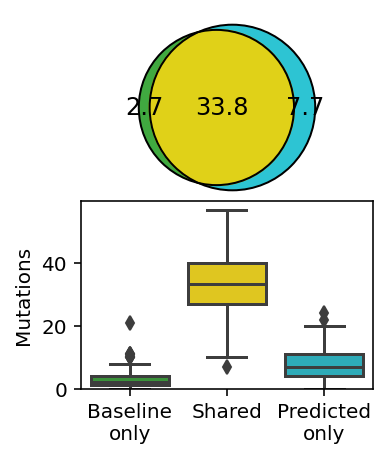

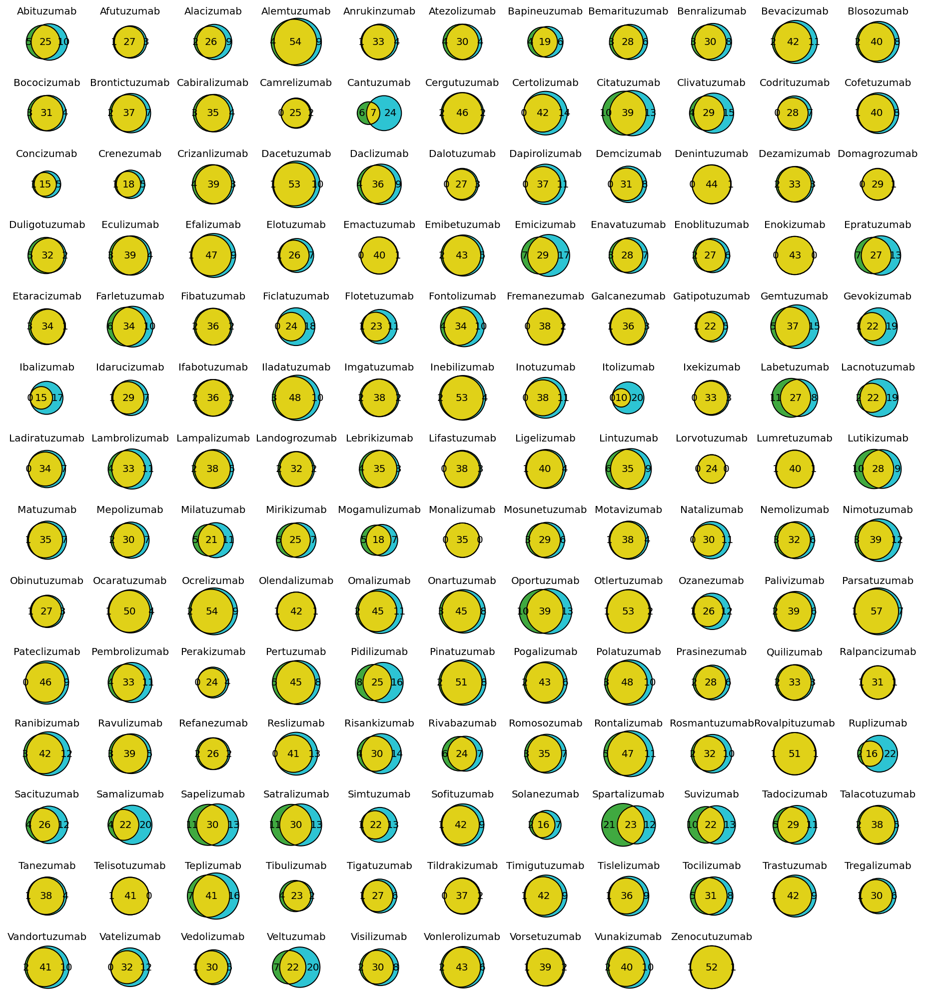

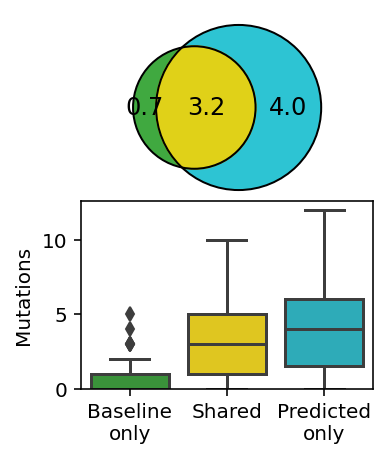

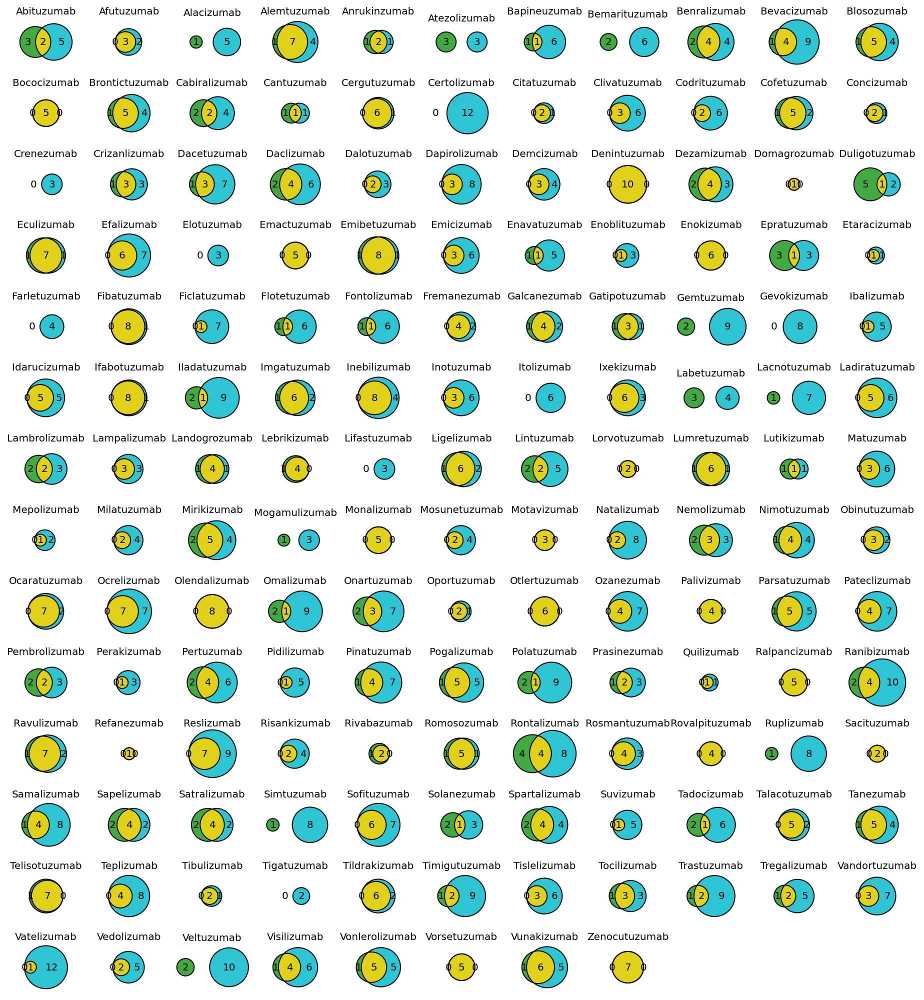

In [35]:
name = STRAIGHT_GRAFT['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
label_colors = dict(baseline_label_color='black', predicted_label_color='black')
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors, **label_colors)
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), **label_colors)
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors, **label_colors)
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), **label_colors)
plt.show()

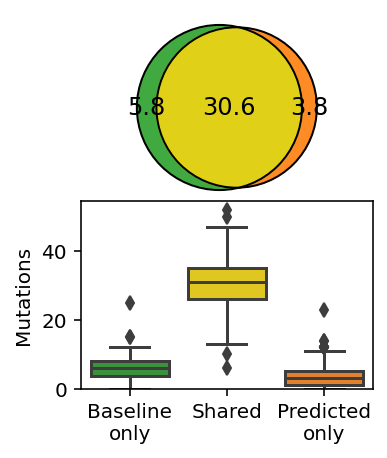

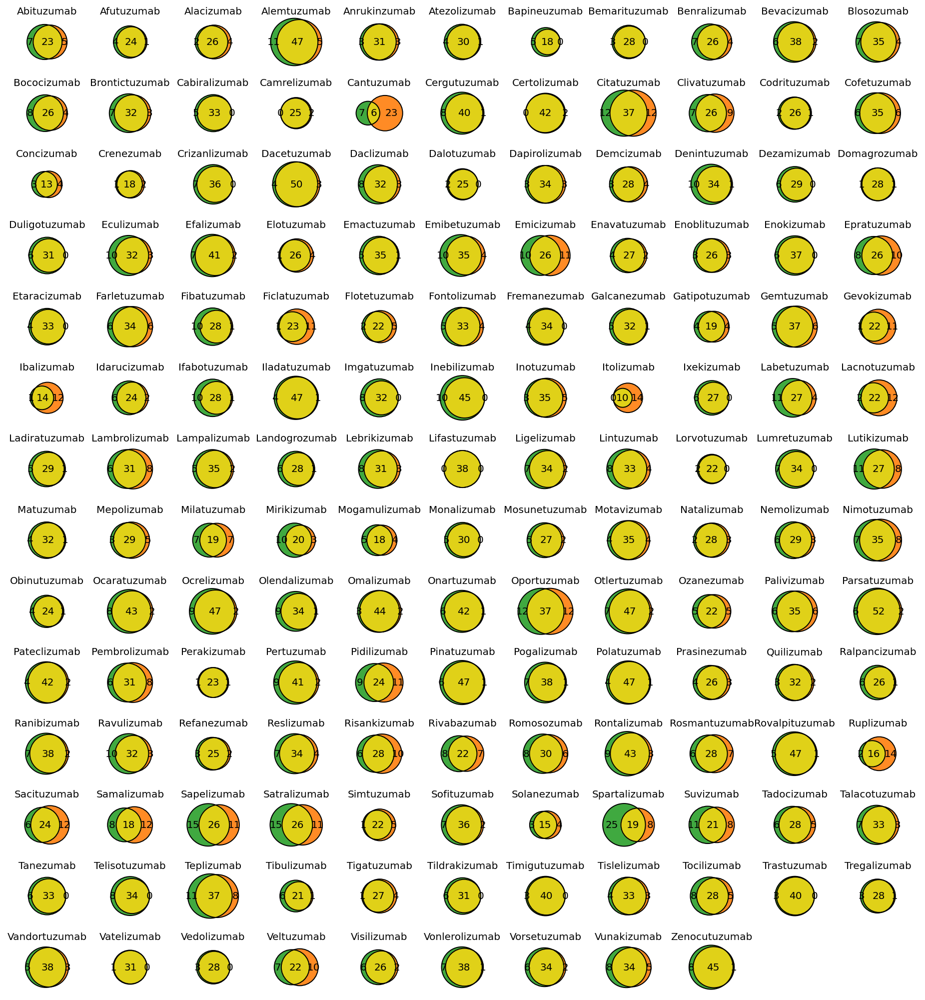

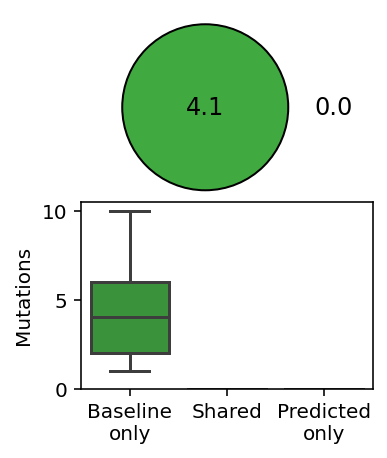

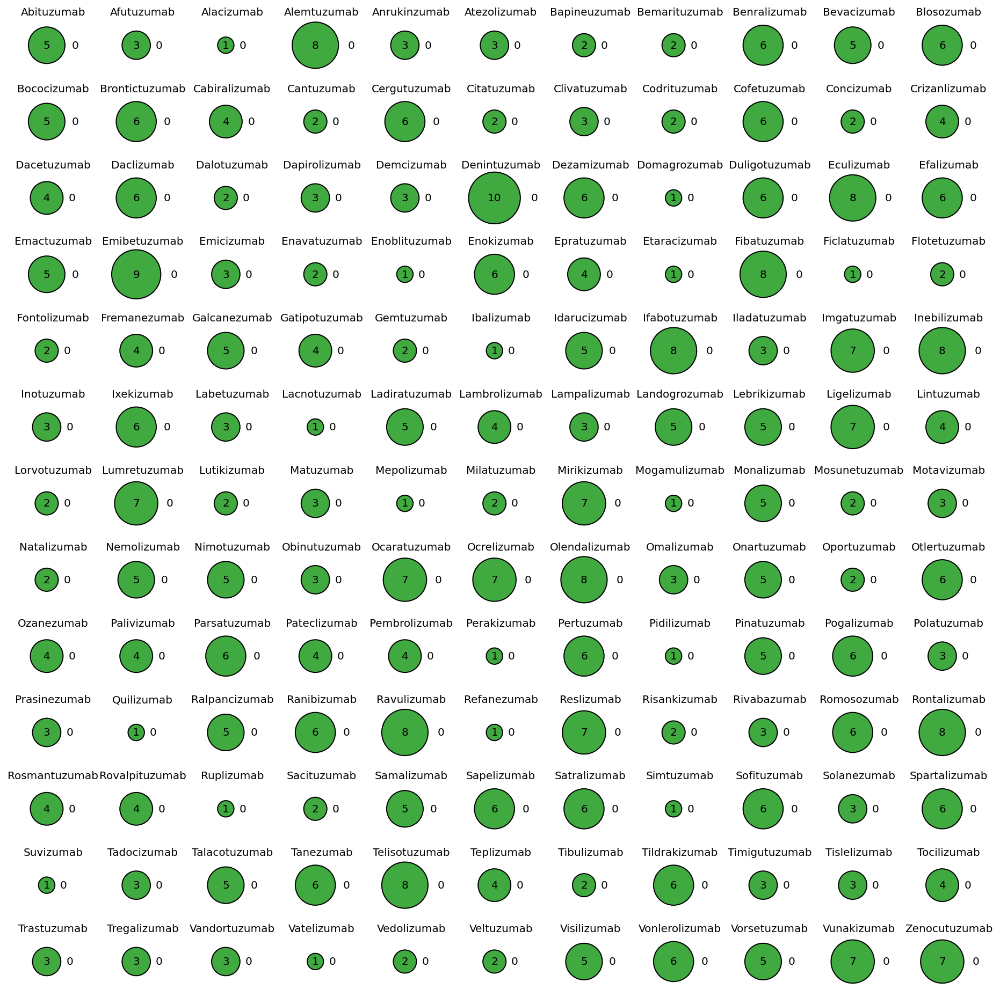

In [36]:
name = VERNIER_GRAFT['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors, **label_colors)
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), **label_colors)
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors, **label_colors)
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), **label_colors)
plt.show()

In [65]:
vernier_overlap = overlap.loc[VERNIER_GRAFT['name']]
vernier_overlap[vernier_overlap.sum(axis=1) - vernier_overlap['Shared'] <= 1]

,Baseline only,Shared,Predicted only
name,,,
Lifastuzumab,0,38,0
Vatelizumab,1,31,0


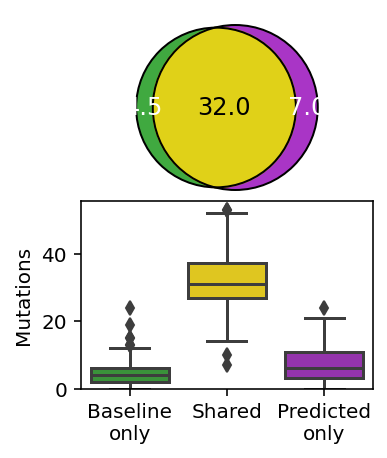

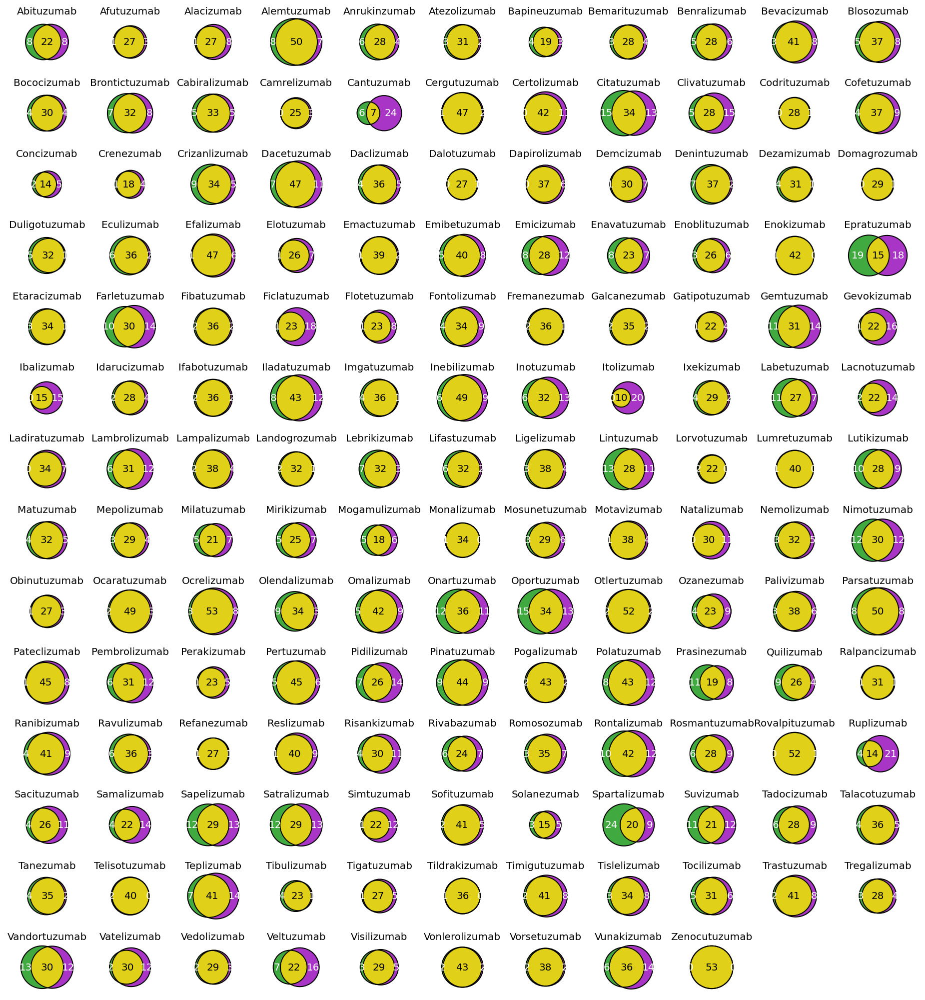

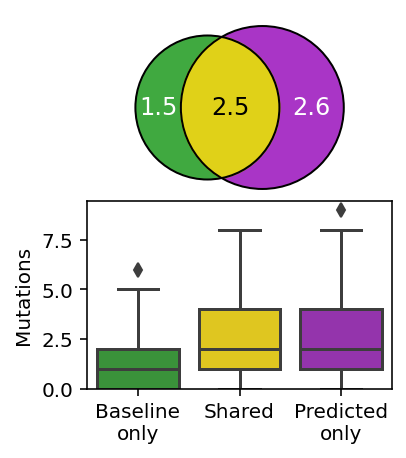

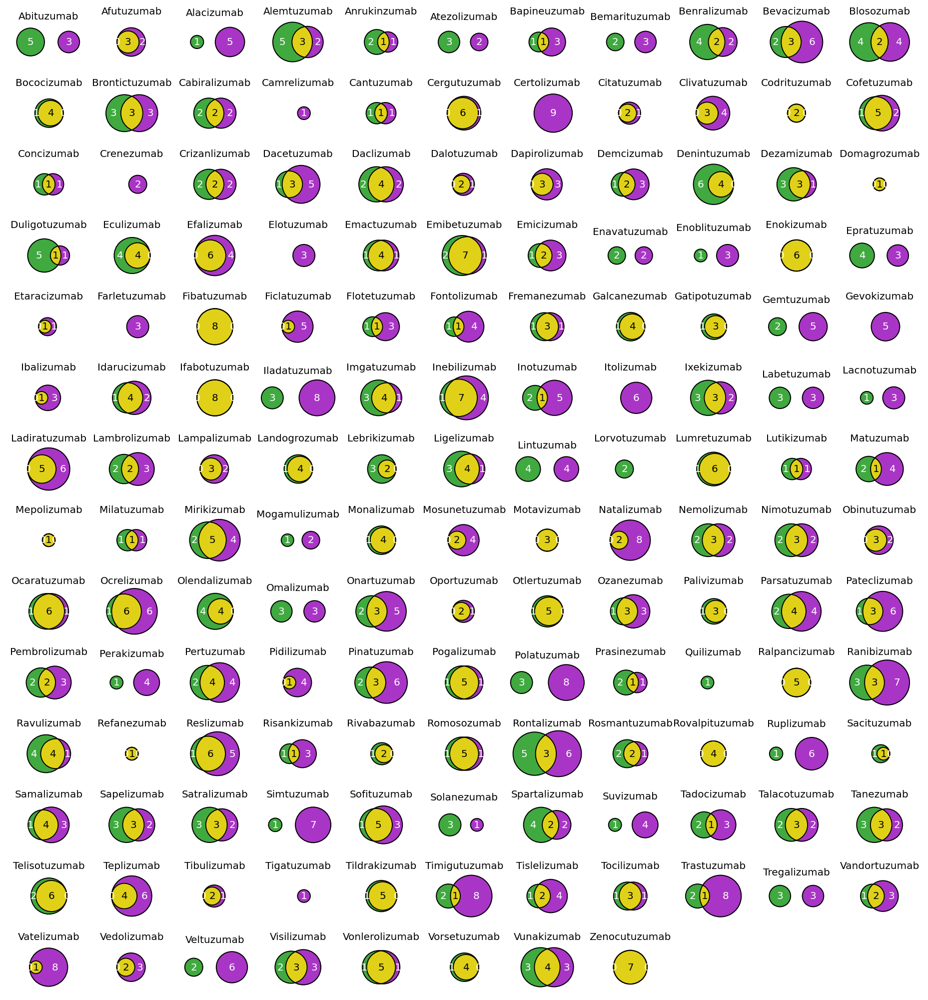

In [37]:
name = SAPIENS['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors)
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14))
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors)
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14))
plt.show()

In [63]:
sapiens_overlap = overlap.loc[SAPIENS['name']]
sapiens_overlap[sapiens_overlap.sum(axis=1) - sapiens_overlap['Shared'] <= 1]

,Baseline only,Shared,Predicted only
name,,,
Codrituzumab,0,28,1
Dalotuzumab,0,27,1
Domagrozumab,0,29,1
Enokizumab,1,42,0
Lumretuzumab,1,40,0
Monalizumab,1,34,0
Rovalpituzumab,0,52,1
Tildrakizumab,1,36,0
Zenocutuzumab,0,53,0


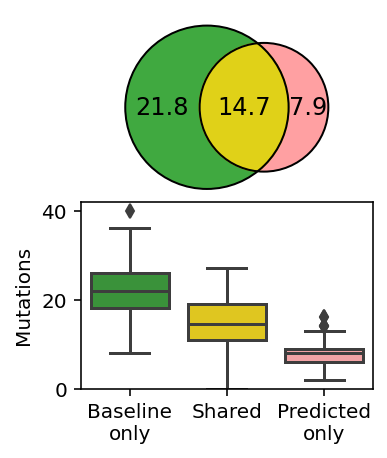

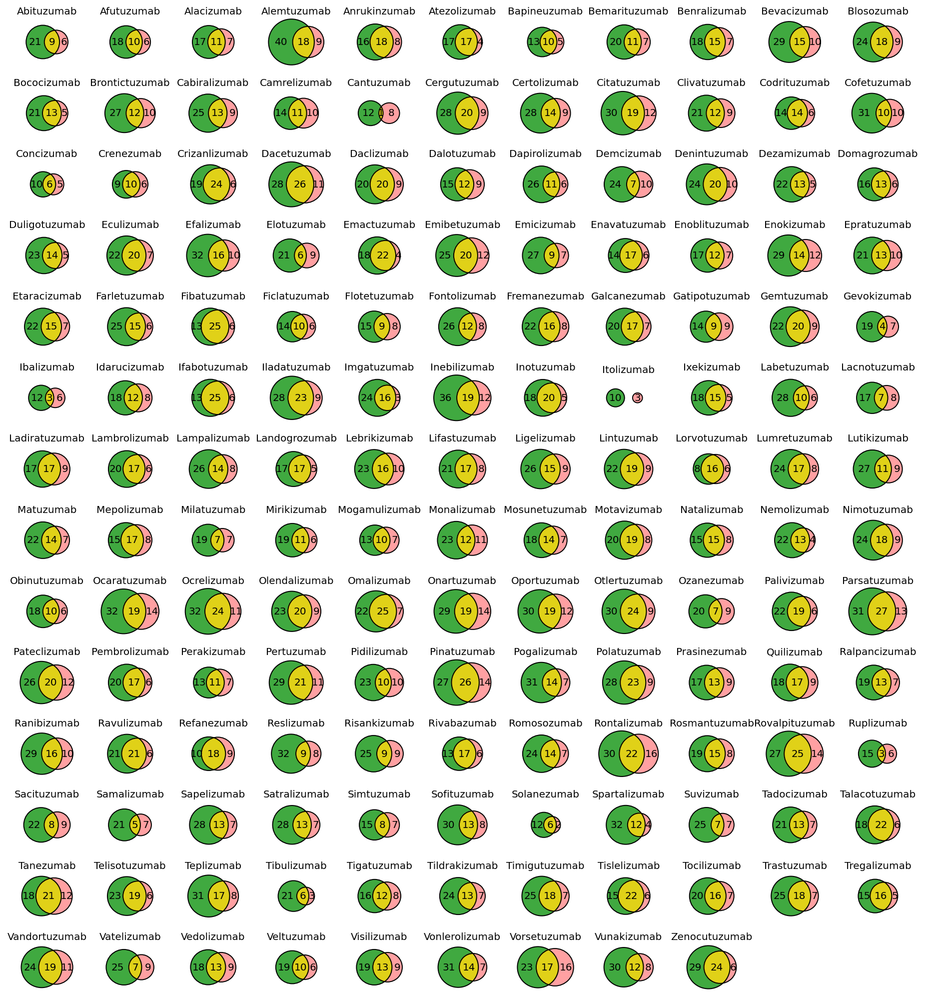

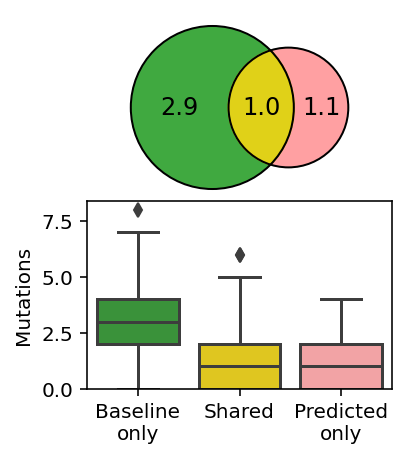

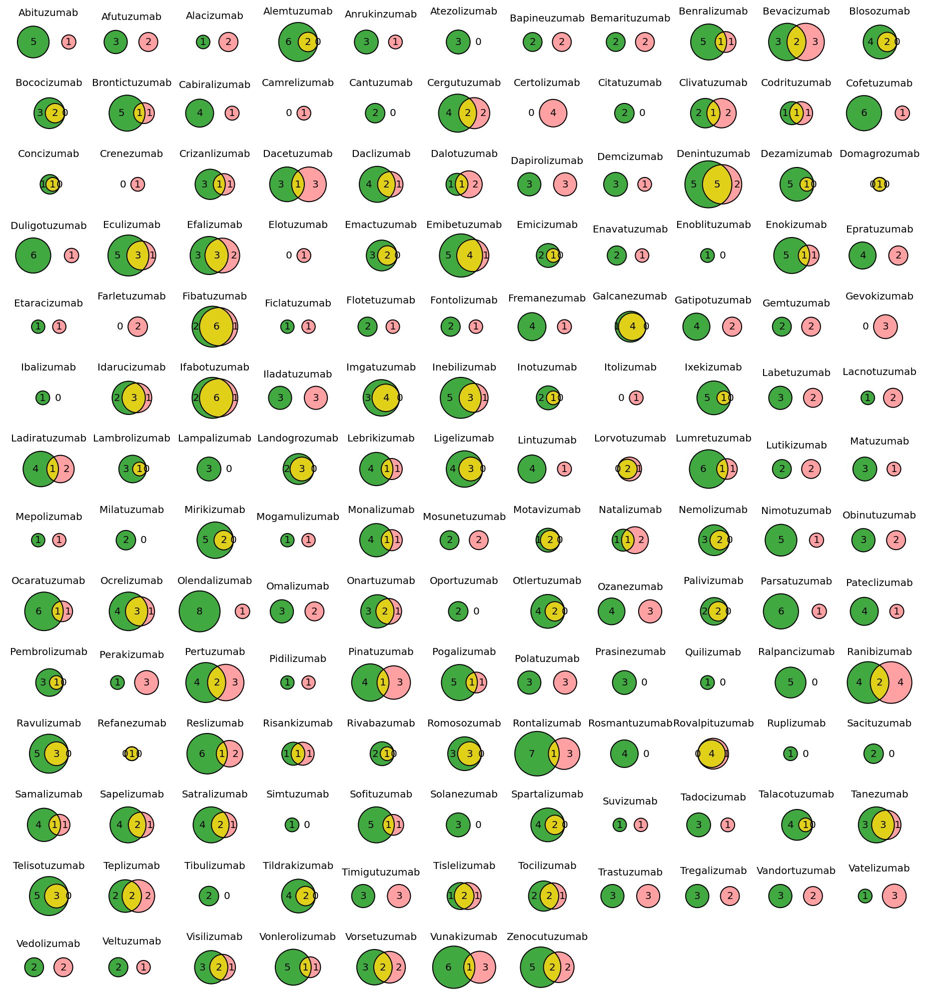

In [39]:
name = HUMAB['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors, **label_colors)
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), **label_colors)
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors, **label_colors)
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), **label_colors)
plt.show()

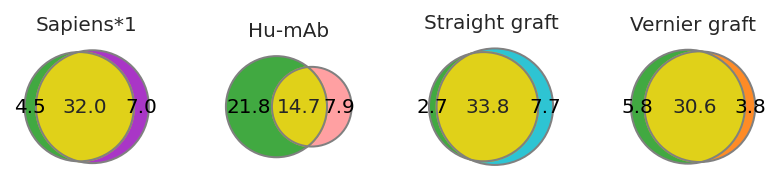

In [40]:
with sns.axes_style('whitegrid'):
    fig, axes = plt.subplots(1, 4, figsize=(5.5, 2.5))
    for i, name in enumerate([SAPIENS['name'], HUMAB['name'], STRAIGHT_GRAFT['name'], VERNIER_GRAFT['name']]):
        colors = {
            'Baseline': COLORS['Experimental'],
            'Prediction': COLORS[name]
        }
        plot_overlap_venn(overlap.loc[name].mean(), colors=colors, fontsize=10, outline='grey',
                          baseline_label_color='black', predicted_label_color='black', ax=axes[i])
        axes[i].set_title(name, fontsize=10)
    fig.tight_layout(w_pad=3);
    fig.savefig('../../data/figures/main/fig7d.pdf', bbox_inches='tight')

In [41]:
def get_conservation_flags(positions):
    positions = positions.set_index('Method', verify_integrity=True)
    return (positions['parental'] == positions['germline']).reindex(HUMANIZED_METHOD_NAMES, fill_value=False)

def get_mutated_flags(positions):
    positions = positions.set_index('Method', verify_integrity=True)
    return (positions['parental'] != positions['predicted']).reindex(HUMANIZED_METHOD_NAMES, fill_value=False)

In [42]:
vernier_conserved_flags = vernier_positions.groupby(['name','pos']).apply(get_conservation_flags)
vernier_conserved_flags.head()

Method           Experimental  Sapiens*1  Hu-mAb  Straight graft  \
name       pos                                                     
Abituzumab H103          True       True    True            True   
           H2            True       True    True            True   
           H27           True       True    True            True   
           H28           True       True    True            True   
           H29           True       True    True            True   

Method           Vernier graft  
name       pos                  
Abituzumab H103           True  
           H2             True  
           H27            True  
           H28            True  
           H29            True

In [43]:
vernier_mutated_flags = vernier_positions.groupby(['name','pos']).apply(get_mutated_flags)
vernier_mutated_flags.head()

Method           Experimental  Sapiens*1  Hu-mAb  Straight graft  \
name       pos                                                     
Abituzumab H103         False      False   False           False   
           H2           False      False   False           False   
           H27          False      False   False           False   
           H28          False      False   False           False   
           H29          False      False   False           False   

Method           Vernier graft  
name       pos                  
Abituzumab H103          False  
           H2            False  
           H27           False  
           H28           False  
           H29           False

In [44]:
def get_contingency_matrix(mutated_flags, conserved_flags, names):
    # select only positions that are not conserved between parent and human germline (in both the first and second sequence)
    mutated_flags = mutated_flags[~conserved_flags[names[0]] & ~conserved_flags[names[1]]]

    first = mutated_flags[names[0]]
    second = mutated_flags[names[1]]
    mutated_both = (first & second).sum()
    mutated_first_only = (first & ~second).sum()
    mutated_second_only = (~first & second).sum()
    mutated_none = (~first & ~second).sum()
    
    contingency = [
        [mutated_both, mutated_second_only],
        [mutated_first_only, mutated_none]
    ]
    return pd.DataFrame(
        contingency, 
        index=[f'Humanized {names[1]}', f'Back-mutated {names[1]}'], 
        columns=[f'Humanized {names[0]}', f'Back-mutated {names[0]}']
    )

In [45]:
def fisher_stats(names):
    heading(' & '.join(names))
    contingency = get_contingency_matrix(
        mutated_flags=vernier_mutated_flags, 
        conserved_flags=vernier_conserved_flags, 
        names=names
    )
    print('p-value:', stats.fisher_exact(contingency, alternative='greater')[1])
    print('Total positions', contingency.sum().sum())
    display(contingency)
    display(contingency / contingency.sum().sum())
    print('TPR = {:.0%}'.format(contingency.iloc[0,0] / contingency.sum()[0]))
    print('FPR = {:.0%}'.format(contingency.iloc[0,1] / contingency.sum()[1]))

# Binary overlap of mutated Vernier positions

**NOTE:** Only positions that are not conserved in both of the two methods were considered to avoid overinflating the true negatives.

In [46]:
for name in HUMANIZED_METHOD_NAMES:
    fisher_stats([EXPERIMENTAL['name'], name])

p-value: 0.0
Total positions 1083


,Humanized Experimental,Back-mutated Experimental
Humanized Experimental,544,0
Back-mutated Experimental,0,539


,Humanized Experimental,Back-mutated Experimental
Humanized Experimental,0.502308,0.000000
Back-mutated Experimental,0.000000,0.497692


TPR = 100%
FPR = 0%


p-value: 4.4203972806823625e-06
Total positions 1035


,Humanized Experimental,Back-mutated Experimental
Humanized Sapiens*1,413,339
Back-mutated Sapiens*1,111,172


,Humanized Experimental,Back-mutated Experimental
Humanized Sapiens*1,0.399034,0.327536
Back-mutated Sapiens*1,0.107246,0.166184


TPR = 79%
FPR = 66%


p-value: 5.713519104875934e-07
Total positions 959


,Humanized Experimental,Back-mutated Experimental
Humanized Hu-mAb,187,102
Back-mutated Hu-mAb,318,352


,Humanized Experimental,Back-mutated Experimental
Humanized Hu-mAb,0.194995,0.106361
Back-mutated Hu-mAb,0.331595,0.367049


TPR = 37%
FPR = 22%


p-value: 1.0
Total positions 1076


,Humanized Experimental,Back-mutated Experimental
Humanized Straight graft,539,537
Back-mutated Straight graft,0,0


,Humanized Experimental,Back-mutated Experimental
Humanized Straight graft,0.500929,0.499071
Back-mutated Straight graft,0.000000,0.000000


TPR = 100%
FPR = 100%


p-value: 1.0
Total positions 1045


,Humanized Experimental,Back-mutated Experimental
Humanized Vernier graft,0,0
Back-mutated Vernier graft,523,522


,Humanized Experimental,Back-mutated Experimental
Humanized Vernier graft,0.000000,0.000000
Back-mutated Vernier graft,0.500478,0.499522


TPR = 0%
FPR = 0%


# OASis Humanness

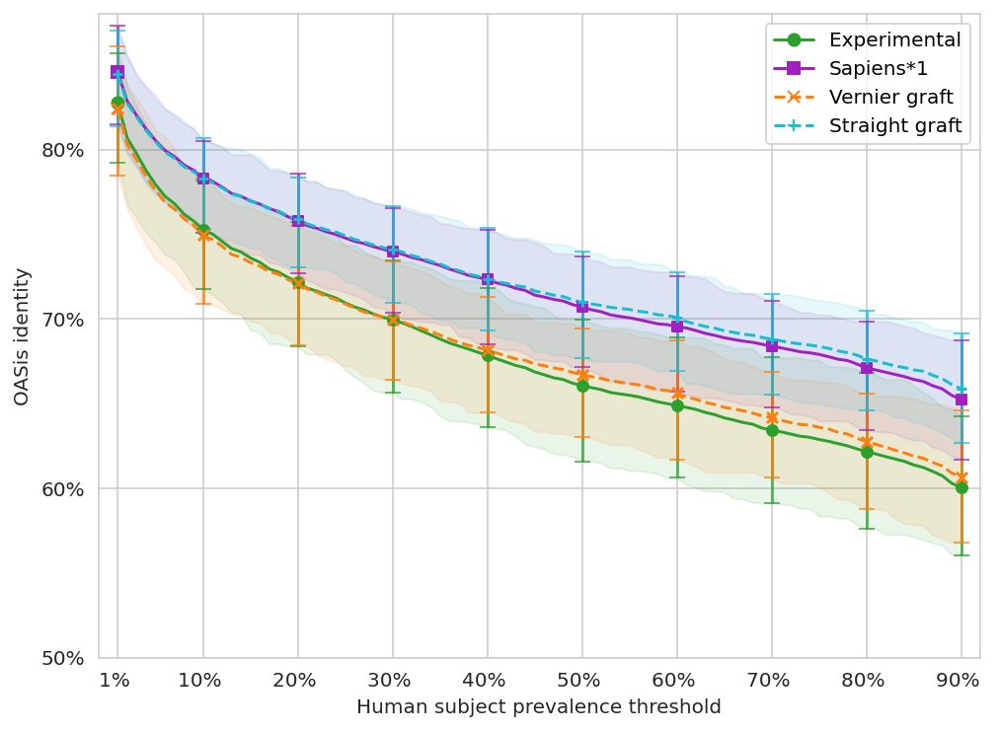

In [47]:
colors = {n: c for n, c in COLORS.items() if n in [EXPERIMENTAL['name'], SAPIENS['name'], VERNIER_GRAFT['name'], STRAIGHT_GRAFT['name']]}
plot_oasis_curves(oasis_curves, groupby='Method', errorbars=True, colors=colors, thresholds=False, linestyles=LINESTYLES, figsize=(8, 6))
ax = plt.gca()
ax.set_ylim(0.50, 0.88);
ax.legend();

# T20 Humanness

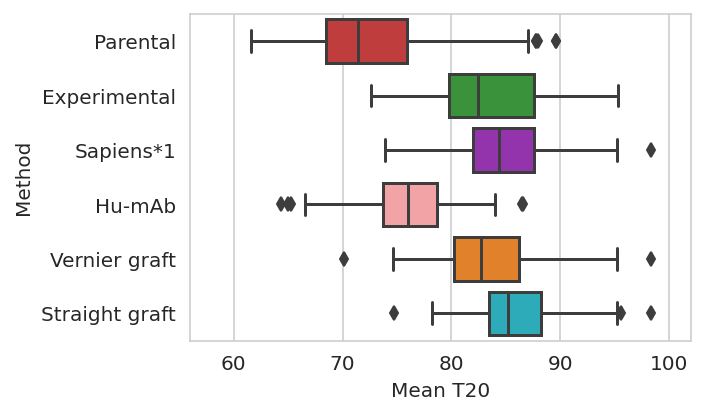

In [48]:
with sns.axes_style('whitegrid'):
    fig, ax = plt.subplots(figsize=(5, 3))
    ax = sns.boxplot(
        data=t20_scores, 
        x='t20', 
        y='Method',
        hue_order=COLORS.keys(),
        palette=COLORS.values(),
        ax=ax
    );
    ax.set_xlabel(f'Mean T20')
    ax.set_xticks(range(50, 101, 10))
    ax.set_xlim([56, 102])
fig.tight_layout();

In [49]:
t20_scores.groupby('Method')['t20'].mean().apply('{:.1f}%'.format)

Method
Experimental      83.4%
Hu-mAb            76.1%
Parental          72.7%
Sapiens*1         85.2%
Straight graft    86.1%
Vernier graft     83.7%
Name: t20, dtype: object

# Humanness-Preservation Tradeoff

In [50]:
preservation = positions.groupby(['Method','name'])['conservation'].value_counts(normalize=True).unstack()[['Back-mutated','Conserved']].sum(axis=1)
preservation

Method         name          
Experimental   Abituzumab        0.866667
               Afutuzumab        0.878788
               Alacizumab        0.875000
               Alemtuzumab       0.745614
               Anrukinzumab      0.851528
                                   ...   
Vernier graft  Visilizumab       0.876106
               Vonlerolizumab    0.825893
               Vorsetuzumab      0.842795
               Vunakizumab       0.829694
               Zenocutuzumab     0.800866
Length: 912, dtype: float64

In [51]:
vernier_preservation = vernier_positions.groupby(['Method','name'])['conservation'].value_counts(normalize=True).unstack()[['Back-mutated','Conserved']].sum(axis=1)
vernier_preservation

Method         name          
Experimental   Abituzumab        0.833333
               Afutuzumab        0.900000
               Alacizumab        0.966667
               Alemtuzumab       0.733333
               Anrukinzumab      0.900000
                                   ...   
Vernier graft  Visilizumab       1.000000
               Vonlerolizumab    1.000000
               Vorsetuzumab      1.000000
               Vunakizumab       1.000000
               Zenocutuzumab     1.000000
Length: 912, dtype: float64

In [52]:
tradeoff = pd.DataFrame({
        'Preservation': preservation,
        'Vernier preservation': vernier_preservation,
        'OASis identity': oasis_curves.set_index(['Method', 'Antibody'])['50%'],
        'T20 score': t20_scores.set_index(['Method', 'Antibody'])['t20'],
})
tradeoff.index.names = ('Method', 'Antibody')
tradeoff['OASis improvement'] = tradeoff.apply(
    lambda row: row['OASis identity'] - tradeoff['OASis identity'].loc[(PARENTAL['name'], row.name[1])],
    axis=1
)
tradeoff['T20 improvement'] = tradeoff.apply(
    lambda row: row['T20 score'] - tradeoff['T20 score'].loc[(PARENTAL['name'], row.name[1])],
    axis=1
)
tradeoff.head()

Preservation  Vernier preservation  OASis identity  \
Method       Antibody                                                           
Experimental Abituzumab        0.866667              0.833333        0.665072   
             Afutuzumab        0.878788              0.900000        0.651163   
             Alacizumab        0.875000              0.966667        0.653846   
             Alemtuzumab       0.745614              0.733333        0.636792   
             Anrukinzumab      0.851528              0.900000        0.751174   

                           T20 score  OASis improvement  T20 improvement  
Method       Antibody                                                     
Experimental Abituzumab    80.234320           0.277512          8.32275  
             Afutuzumab    83.727720           0.288372          9.91335  
             Alacizumab    84.340070           0.173077         10.53115  
             Alemtuzumab   78.961085           0.344340         10.31030  
             Anrukinzumab  85.109620           0.145540         10.16395

In [53]:
mean_tradeoff = tradeoff.groupby(level=0).mean()
mean_tradeoff

,Preservation,Vernier preservation,OASis identity,T20 score,OASis improvement,T20 improvement
Method,,,,,,
Experimental,0.839892,0.869956,0.660619,83.400103,0.296246,10.710574
Hu-mAb,0.900649,0.929825,0.515627,76.110556,0.151254,3.421028
Parental,1.000000,1.000000,0.364373,72.689529,0.000000,0.000000
Sapiens*1,0.829176,0.833553,0.706991,85.238026,0.342618,12.548497
Straight graft,0.817802,0.763816,0.709804,86.086994,0.345431,13.397465
Vernier graft,0.848900,1.000000,0.667100,83.692412,0.302727,11.002884


In [54]:
def plot_tradeoff(data, ax=None, s=50, text=True, ticklim=None, tickstep=0.1, **kwargs):
    x = data.iloc[:,0]
    y = data.iloc[:,1]
    ax = sns.scatterplot(
        data=data,
        x=x,
        y=y,
        hue='Method',
        palette=COLORS,
        legend=False,
        s=s,
        ax=ax,
        **kwargs
    )
    ax.grid(False)
    if text:
        for method, row in data.iterrows():
            if method == PARENTAL['name']:
                ax.text(row[0], row[1], '  '+method, fontsize=11, ha='left', va='center')
            else:
                ax.text(row[0], row[1], method+'  ', fontsize=11, ha='right', va='center')
    
    ax.set_yticks(ax.get_yticks());
    if ticklim is not None:
        xmin, xmax = ticklim
    else:
        xmin = (ax.get_xlim()[0]*100//5*5)/100
        xmax = ax.get_xlim()[1]
    xticks = np.arange(xmin, xmax+0.01, tickstep)
    ax.set_xticks(xticks);
    ax.set_yticklabels([f'{v:.0%}' for v in ax.get_yticks()]);
    ax.set_xticklabels([f'{v:+.0%}' for v in xticks]);
    ax.set_ylim([ax.get_ylim()[0], 1.015])

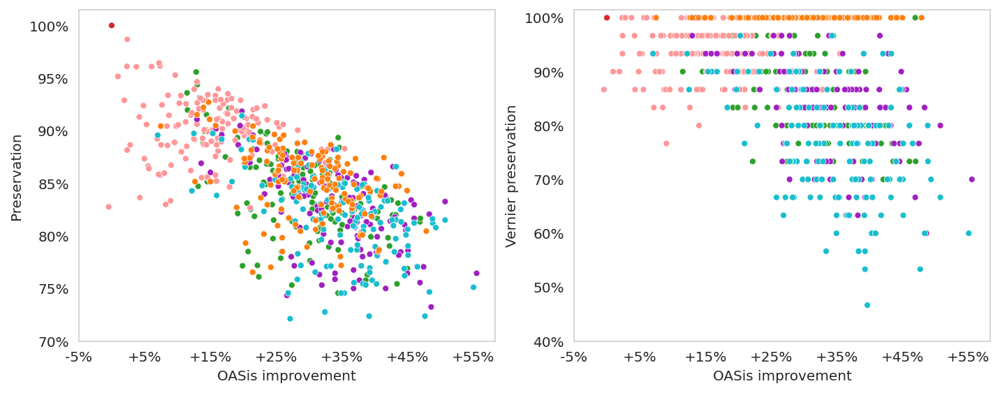

In [55]:
with sns.axes_style('whitegrid'):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    plot_tradeoff(tradeoff[['OASis improvement', 'Preservation']].reset_index(level=1, drop=True), text=False, s=20, ax=axes[0])
    plot_tradeoff(tradeoff[['OASis improvement', 'Vernier preservation']].reset_index(level=1, drop=True), text=False, s=20, ax=axes[1])
    fig.tight_layout();

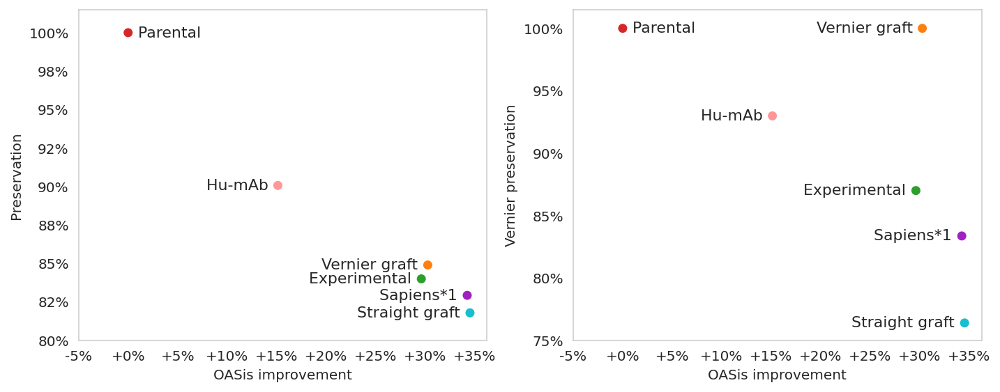

In [56]:
with sns.axes_style('whitegrid'):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Preservation']], ax=axes[0], tickstep=0.05)
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Vernier preservation']], ax=axes[1], tickstep=0.05)
    fig.tight_layout();

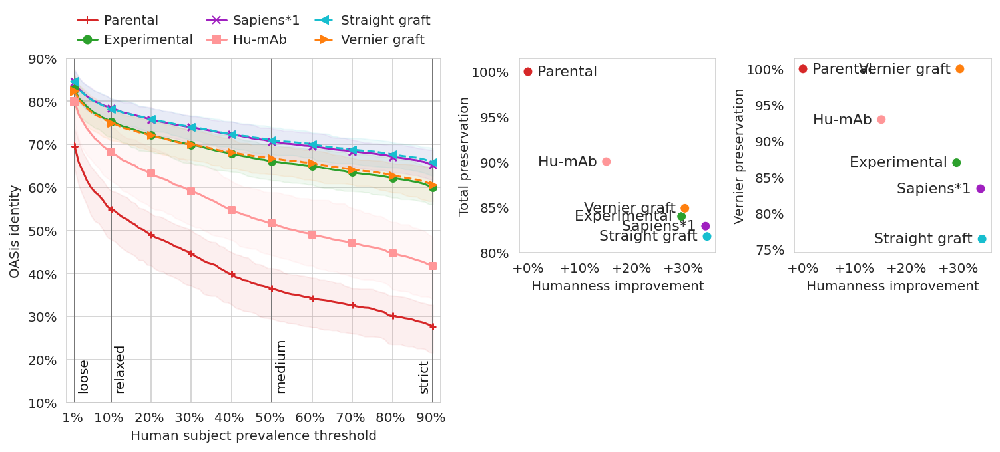

In [57]:
with sns.axes_style('whitegrid'):
    fig = plt.figure(figsize=(10.5, 4.8))
    gs = fig.add_gridspec(2, 3, width_ratios=[1.9, 1, 1], height_ratios=[2, 1])
    ax1 = fig.add_subplot(gs[:, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, 1])
    ax4 = fig.add_subplot(gs[0, 2])
    ax5 = fig.add_subplot(gs[1, 2])

    ax = ax1
    plot_oasis_curves(
        oasis_curves, 
        groupby='Method', 
        ncol=3, 
        colors=SELECTED_COLORS, 
        linestyles=LINESTYLES, 
        lw=1.5, 
        ylim=(0.1, 0.9),
        markers='+oxs<>',
        fill_alpha=0.07,
        ax=ax
    )
    name = SAPIENS['name']
    colors = {
        'Baseline': COLORS['Experimental'],
        'Prediction': COLORS[name]
    }
    ax3.set_visible(False)
    ax5.set_visible(False)
    
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Preservation']], ax=ax2, ticklim=(0, 0.35))
    ax2.set_ylim(0.80)
    ax2.set_xlabel('Humanness improvement')
    ax2.set_ylabel('Total preservation')
    ax2.yaxis.labelpad = 0
    
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Vernier preservation']], ax=ax4, ticklim=(0, 0.35))
    ax4.set_ylim(0.745)
    ax4.set_xlabel('Humanness improvement')
    ax4.yaxis.labelpad = 0

    fig.tight_layout()
    fig.savefig('../../data/figures/main/fig7a.pdf', bbox_inches='tight')

# Result table

In [58]:
table = pd.DataFrame({
    ('Humanness improvement', 'OASis (medium)'): mean_tradeoff['OASis improvement'],
    ('Humanness improvement', 'T20'): mean_tradeoff['T20 improvement'] / 100,
    ('Parental preservation', 'Total'): mean_tradeoff['Preservation'],
    ('Parental preservation', 'Vernier'): mean_tradeoff['Vernier preservation'],
    ('Mutation precision', 'Total'): precision,
    ('Mutation precision', 'Vernier'): vernier_precision
})
table = table.drop([PARENTAL['name']])
table.apply({
    table.columns[0]: lambda col: col.apply('{:+.1%}'.format),
    table.columns[1]: lambda col: col.apply('{:+.1%}'.format),
    table.columns[2]: lambda col: col.apply('{:.1%}'.format),
    table.columns[3]: lambda col: col.apply('{:.1%}'.format),
    table.columns[4]: lambda col: col.apply('{:.1%}'.format),
    table.columns[5]: lambda col: col.apply('{:.1%}'.format)
})

Humanness improvement         Parental preservation          \
                      OASis (medium)     T20                 Total Vernier   
Method                                                                       
Experimental                  +29.6%  +10.7%                 84.0%   87.0%   
Hu-mAb                        +15.1%   +3.4%                 90.1%   93.0%   
Sapiens*1                     +34.3%  +12.5%                 82.9%   83.4%   
Straight graft                +34.5%  +13.4%                 81.8%   76.4%   
Vernier graft                 +30.3%  +11.0%                 84.9%  100.0%   

               Mutation precision          
                            Total Vernier  
Method                                     
Experimental               100.0%  100.0%  
Hu-mAb                      65.0%   47.5%  
Sapiens*1                   82.1%   48.9%  
Straight graft              81.4%   44.6%  
Vernier graft               89.0%    nan%

In [59]:
for method, rows in tradeoff.groupby(level=0):
    print('')
    print(method)
    display(rows.sort_values('T20 improvement')[['T20 improvement','T20 score']])


Experimental


T20 improvement  T20 score
Method       Antibody                                  
Experimental Prasinezumab          -0.221250  89.339185
             Citatuzumab            0.357150  88.131920
             Oportuzumab            0.357150  88.131920
             Spartalizumab          1.329150  75.112770
             Cantuzumab             1.809300  77.723270
...                                      ...        ...
             Vonlerolizumab        16.924985  83.622570
             Enokizumab            17.993750  83.957870
             Timigutuzumab         18.594985  89.552785
             Trastuzumab           18.594985  89.552785
             Zenocutuzumab         22.034315  94.997685

[152 rows x 2 columns]


Hu-mAb


T20 improvement  T20 score
Method Antibody                                
Hu-mAb Citatuzumab        -13.547000  74.227770
       Oportuzumab        -13.547000  74.227770
       Epratuzumab        -12.212300  74.266085
       Prasinezumab       -11.701315  77.859120
       Sofituzumab         -9.518150  73.370120
...                              ...        ...
       Tislelizumab        10.374185  79.393420
       Fibatuzumab         10.681615  83.936885
       Ifabotuzumab        10.681615  83.936885
       Eculizumab          10.780850  76.187670
       Ravulizumab         10.780850  76.064720

[152 rows x 2 columns]


Parental


T20 improvement  T20 score
Method   Antibody                                 
Parental Abituzumab                 0.0  71.911570
         Palivizumab                0.0  65.573735
         Parsatuzumab               0.0  70.082620
         Pateclizumab               0.0  70.293720
         Pembrolizumab              0.0  67.019485
...                                 ...        ...
         Gatipotuzumab              0.0  87.908985
         Gemtuzumab                 0.0  77.212470
         Gevokizumab                0.0  71.552820
         Ficlatuzumab               0.0  68.308520
         Zenocutuzumab              0.0  72.963370

[152 rows x 2 columns]


Sapiens*1


T20 improvement  T20 score
Method    Antibody                                  
Sapiens*1 Citatuzumab            0.285965  88.060735
          Oportuzumab            0.285965  88.060735
          Quilizumab             1.276300  79.113470
          Solanezumab            4.901365  94.511635
          Lifastuzumab           5.072635  78.577420
...                                   ...        ...
          Vonlerolizumab        17.886535  84.584120
          Pogalizumab           17.886535  84.584120
          Vatelizumab           17.960000  81.757320
          Vunakizumab           19.130400  81.889820
          Zenocutuzumab         22.034315  94.997685

[152 rows x 2 columns]


Straight graft


T20 improvement  T20 score
Method         Antibody                                  
Straight graft Prasinezumab          -0.154850  89.405585
               Oportuzumab            2.495815  90.270585
               Citatuzumab            2.495815  90.270585
               Quilizumab             5.139250  82.976420
               Solanezumab            5.972815  95.583085
...                                        ...        ...
               Ficlatuzumab          18.958365  87.266885
               Cofetuzumab           19.113500  83.307270
               Pogalizumab           19.638950  86.336535
               Vonlerolizumab        19.638950  86.336535
               Zenocutuzumab         21.772215  94.735585

[152 rows x 2 columns]


Vernier graft


T20 improvement  T20 score
Method        Antibody                                 
Vernier graft Prasinezumab          0.575200  90.135635
              Citatuzumab           2.027065  89.801835
              Oportuzumab           2.027065  89.801835
              Vandortuzumab         2.048100  78.686920
              Quilizumab            4.222750  82.059920
...                                      ...        ...
              Ficlatuzumab         15.610450  83.918970
              Cofetuzumab          16.248600  80.442370
              Timigutuzumab        17.655285  88.613085
              Trastuzumab          17.655285  88.613085
              Zenocutuzumab        18.720450  91.683820

[152 rows x 2 columns]